In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [ ]:
from google.colab import files
files.upload()

Saving 2015-building-energy-benchmarking.csv to 2015-building-energy-benchmarking.csv
Saving 2016-building-energy-benchmarking.csv to 2016-building-energy-benchmarking.csv


{'2015-building-energy-benchmarking.csv': b'OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,Location,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity(kgCO2e/ft2),DefaultData,Comment,ComplianceStatus,Outlier,2010 Census Tracts,Seattle Police Department Micro Community Policing Plan Areas,City Council Districts,SPD Beats,Zip Codes\r\n1,2015,NonResidenti

In [ ]:
data_2015=pd.read_csv("2015-building-energy-benchmarking.csv")
data_2016=pd.read_csv("2016-building-energy-benchmarking.csv")
data_2015.head(2)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,Location,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity(kgCO2e/ft2),DefaultData,Comment,ComplianceStatus,Outlier,2010 Census Tracts,Seattle Police Department Micro Community Policing Plan Areas,City Council Districts,SPD Beats,Zip Codes
0,1,2015,NonResidential,Hotel,MAYFLOWER PARK HOTEL,659000030,"{'latitude': '47.61219025', 'longitude': '-122...",7,DOWNTOWN,1927,1,12.0,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,65.0,78.9,80.3,173.5,175.1,6981428.0,7097539.0,2023032.0,1080307.0,3686160.0,12724.0,1272388.0,0.0,249.43,2.64,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081
1,2,2015,NonResidential,Hotel,PARAMOUNT HOTEL,659000220,"{'latitude': '47.61310583', 'longitude': '-122...",7,DOWNTOWN,1996,1,11.0,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,51.0,94.4,99.0,191.3,195.2,8354235.0,8765788.0,0.0,1144563.0,3905411.0,44490.0,4448985.0,0.0,263.51,2.38,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081


### Features meaning

**OSEBuildingID**: Property identifier  **BuildingType**:Classification        

**PropertyGFATotal**:  the total floor area inside the building envelope 

**PropertyGFAParking**: total space of parking **PropertyGFABuilding(s)**: total floor space

**SiteEUI**: Site annual ammount of energy consumption measured in thousands of britsh thermal units per square feet

**SourceEUI**: Source annual ammount of energy consumption measured in thousands of britsh thermal units per square feet

**TotalGHGEmissions**: Total green house gas emission

**GHGEmissionsIntensity**: Total green house gas emission devided by the property s gross floor area

For the rest of the features check the link below:

https://data.seattle.gov/dataset/2016-Building-Energy-Benchmarking/2bpz-gwpy


In [ ]:
print(data_2016.shape)
print(data_2015.shape)

(3376, 46)
(3340, 47)


In [ ]:
def check_columns(df1,df2):
  # check difference in columns between two dataframes
  columns_df1=list(df1.columns)
  columns_df2=list(df2.columns)
  liste1=[col for col in columns_df1 if col not in columns_df2]
  liste2=[col for col in columns_df2 if col not in columns_df1]

  #return liste1
  print('variables in df1 and not in df2 are:{}'.format(liste1))
  print('variables in df2 and not in df1 are:{}'.format(liste2))

In [ ]:
check_columns(data_2015,data_2016)

variables in df1 and not in df2 are:['Location', 'OtherFuelUse(kBtu)', 'GHGEmissions(MetricTonsCO2e)', 'GHGEmissionsIntensity(kgCO2e/ft2)', 'Comment', '2010 Census Tracts', 'Seattle Police Department Micro Community Policing Plan Areas', 'City Council Districts', 'SPD Beats', 'Zip Codes']
variables in df2 and not in df1 are:['Address', 'City', 'State', 'ZipCode', 'Latitude', 'Longitude', 'Comments', 'TotalGHGEmissions', 'GHGEmissionsIntensity']


### Transform Columns 

##### Data 2015 and 2016 not aligned : (different columns, information distributed differently)

In [ ]:
data_2015["Location"][0]

'{\'latitude\': \'47.61219025\', \'longitude\': \'-122.33799744\', \'human_address\': \'{"address": "405 OLIVE WAY", "city": "SEATTLE", "state": "WA", "zip": "98101"}\'}'

The Location variable in data 2015, contains several informations that we need to dispatch 

We have variables spelled differently in each data that we need to rename in order to merge them

In [ ]:
data_2015['GHGEmissionsIntensity(kgCO2e/ft2)'].describe()

count    3330.000000
mean        0.985339
std         1.637172
min         0.000000
25%         0.080000
50%         0.460000
75%         1.180000
max        31.380000
Name: GHGEmissionsIntensity(kgCO2e/ft2), dtype: float64

In [ ]:
data_2016['GHGEmissionsIntensity'].describe()

count    3367.000000
mean        1.175916
std         1.821452
min        -0.020000
25%         0.210000
50%         0.610000
75%         1.370000
max        34.090000
Name: GHGEmissionsIntensity, dtype: float64

The unit of **GHGEmissionsIntensity** of data_2016 is unknown but with the orders of magnitude, we can see that we can align the two features

In [ ]:
import ast
def transform_data(df):

  df['Location']=df['Location'].apply(lambda x: ast.literal_eval(x))
  df['Latitude']=df['Location'].apply(lambda x: x['latitude'])
  df['Longitude']=df['Location'].apply(lambda x: x['longitude'])
  df['Address']=df['Location'].apply(lambda x: ast.literal_eval(x['human_address'])['address'])
  df['City']=df['Location'].apply(lambda x: ast.literal_eval(x['human_address'])['city'])
  df['State']=df['Location'].apply(lambda x: ast.literal_eval(x['human_address'])['state'])
  df.rename({'GHGEmissionsIntensity(kgCO2e/ft2)':'GHGEmissionsIntensity',\
                    'GHGEmissions(MetricTonsCO2e)':'TotalGHGEmissions','Comment':'Comments',\
                               'Zip Codes':'ZipCode'},axis=1,inplace=True)

  return df 

In [ ]:
data_2015=transform_data(data_2015)

In [ ]:
check_columns(data_2015,data_2016)

NameError: ignored

We can see that we have some extra variables in data_2015

We are going to check wether we keep them or not

In [ ]:
data_2015[['Location','OtherFuelUse(kBtu)','2010 Census Tracts','Seattle Police Department Micro Community Policing Plan Areas',\
 'City Council Districts','SPD Beats']].isna().sum()

Location                                                            0
OtherFuelUse(kBtu)                                                 10
2010 Census Tracts                                               3116
Seattle Police Department Micro Community Policing Plan Areas       2
City Council Districts                                           3127
SPD Beats                                                           2
dtype: int64

**2010 Census Tracts** and **City Council Districts** are filled with nans

**Location** is no more useful since we have the **Longitude** and **Latitude**

**Seattle Police Department Micro Community Policing Plan Areas** and **SPD Beats** are fiels that concerns Seattle Police department. such informations are useless to our purpose

All these features are to remove

In [ ]:
data_2015['OtherFuelUse(kBtu)'].value_counts().head(5)

0.0          3313
178094.0        1
337952.0        1
12551.0         1
1943011.0       1
Name: OtherFuelUse(kBtu), dtype: int64

99% of the **OtherFuelUse** is filled with 0, which gives no information, so we'll remove it either

In [ ]:
data_2015.drop(['2010 Census Tracts','City Council Districts','Location','Seattle Police Department Micro Community Policing Plan Areas','SPD Beats','OtherFuelUse(kBtu)'],axis=1,inplace=True)

In [ ]:
check_columns(data_2015,data_2016)

variables in df1 and not in df2 are:[]
variables in df2 and not in df1 are:[]


No unique columns remain in each datasets. Now we can combine them

In [ ]:
Seattle_dt=pd.concat([data_2015,data_2016],ignore_index=True,sort=True)
Seattle_dt.shape

(6716, 46)

In [ ]:
Seattle_dt.describe()

,CouncilDistrictCode,DataYear,ENERGYSTARScore,Electricity(kBtu),Electricity(kWh),GHGEmissionsIntensity,LargestPropertyUseTypeGFA,NaturalGas(kBtu),NaturalGas(therms),NumberofBuildings,NumberofFloors,OSEBuildingID,PropertyGFABuilding(s),PropertyGFAParking,PropertyGFATotal,SecondLargestPropertyUseTypeGFA,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SteamUse(kBtu),ThirdLargestPropertyUseTypeGFA,TotalGHGEmissions,YearBuilt,ZipCode
count,6716.000000,6716.00000,5093.000000,6.697000e+03,6.697000e+03,6697.000000,6.560000e+03,6.697000e+03,6.697000e+03,6708.000000,6708.000000,6716.000000,6.716000e+03,6716.000000,6.716000e+03,3238.000000,6699.000000,6700.000000,6.701000e+03,6.700000e+03,6697.000000,6697.000000,6.697000e+03,1156.000000,6697.000000,6716.000000,6700.000000
mean,4.445057,2015.50268,67.906342,3.591058e+06,1.052458e+06,1.081154,7.707936e+04,1.311223e+06,1.311223e+04,1.071407,4.695736,20867.420488,8.329450e+04,9519.597975,9.281410e+04,28074.100153,54.182341,57.308522,5.194673e+06,5.240110e+06,133.510303,138.356802,2.625076e+05,11262.497750,114.935638,1968.101549,58570.218060
std,2.123749,0.50003,27.012124,1.248728e+07,3.659769e+06,1.734763,1.681617e+05,5.685627e+06,5.685626e+04,1.593505,5.476218,11878.968174,1.733470e+05,33868.050881,1.875062e+05,53473.984688,55.101657,56.390651,1.813648e+07,1.500896e+07,135.677195,135.302508,3.704221e+06,26287.655182,478.876573,33.020391,39670.096871
min,1.000000,2015.00000,1.000000,-1.154170e+05,-3.382680e+04,-0.020000,5.656000e+03,0.000000e+00,0.000000e+00,0.000000,0.000000,1.000000,-5.055000e+04,-3.000000,1.128500e+04,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,-2.000000,-2.100000,0.000000e+00,0.000000,-0.800000,1900.000000,17916.000000
25%,3.000000,2015.00000,52.000000,6.372730e+05,1.867660e+05,0.160000,2.501600e+04,0.000000e+00,0.000000e+00,1.000000,2.000000,19934.000000,2.727300e+04,0.000000,2.848700e+04,4993.000000,27.600000,29.600000,9.200689e+05,9.818029e+05,74.000000,79.199997,0.000000e+00,2325.000000,9.450000,1948.000000,18390.000000
50%,4.000000,2016.00000,75.000000,1.167735e+06,3.422434e+05,0.540000,3.953000e+04,3.051000e+05,3.051000e+03,1.000000,4.000000,23064.000000,4.218500e+04,0.000000,4.400800e+04,10631.000000,38.000000,40.900000,1.791071e+06,1.926136e+06,95.600000,102.099998,0.000000e+00,5039.000000,33.180000,1974.000000,98061.500000
75%,7.000000,2016.00000,90.000000,2.797320e+06,8.198140e+05,1.280000,7.417800e+04,1.149639e+06,1.149639e+04,1.000000,5.000000,25868.250000,8.112000e+04,0.000000,8.943125e+04,26462.000000,60.200000,64.925001,4.135280e+06,4.377974e+06,143.900000,149.800000,0.000000e+00,10270.000000,91.530000,1996.000000,98115.000000
max,7.000000,2016.00000,100.000000,6.570744e+08,1.925775e+08,34.090000,9.320156e+06,2.979090e+08,2.979090e+06,111.000000,99.000000,50226.000000,9.320156e+06,512608.000000,9.320156e+06,686750.000000,834.400024,834.400024,8.739237e+08,4.716139e+08,2620.000000,2620.000000,1.349435e+08,459748.000000,16870.980000,2015.000000,98272.000000


In [ ]:
Seattle_dt.head()

,Address,BuildingType,City,Comments,ComplianceStatus,CouncilDistrictCode,DataYear,DefaultData,ENERGYSTARScore,Electricity(kBtu),Electricity(kWh),GHGEmissionsIntensity,LargestPropertyUseType,LargestPropertyUseTypeGFA,Latitude,ListOfAllPropertyUseTypes,Longitude,NaturalGas(kBtu),NaturalGas(therms),Neighborhood,NumberofBuildings,NumberofFloors,OSEBuildingID,Outlier,PrimaryPropertyType,PropertyGFABuilding(s),PropertyGFAParking,PropertyGFATotal,PropertyName,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),State,SteamUse(kBtu),TaxParcelIdentificationNumber,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,TotalGHGEmissions,YearBuilt,YearsENERGYSTARCertified,ZipCode
0,405 OLIVE WAY,NonResidential,SEATTLE,NaN,Compliant,7,2015,No,65.0,3686160.0,1080307.0,2.64,Hotel,88434.0,47.61219025,Hotel,-122.33799744,1272388.0,12724.0,DOWNTOWN,1.0,12.0,1,NaN,Hotel,88434,0,88434,MAYFLOWER PARK HOTEL,NaN,NaN,78.9,80.3,6981428.0,7097539.0,173.5,175.1,WA,2023032.0,659000030,NaN,NaN,249.43,1927,NaN,18081.0
1,724 PINE ST,NonResidential,SEATTLE,NaN,Compliant,7,2015,No,51.0,3905411.0,1144563.0,2.38,Hotel,83880.0,47.61310583,"Hotel, Parking, Restaurant",-122.33335756,4448985.0,44490.0,DOWNTOWN,1.0,11.0,2,NaN,Hotel,88502,15064,103566,PARAMOUNT HOTEL,Parking,15064.0,94.4,99.0,8354235.0,8765788.0,191.3,195.2,WA,0.0,659000220,Restaurant,4622.0,263.51,1996,NaN,18081.0
2,1900 5TH AVE,NonResidential,SEATTLE,NaN,Compliant,7,2015,Yes,18.0,49762435.0,14583930.0,1.92,Hotel,757243.0,47.61334897,"Hotel, Parking, Swimming Pool",-122.33769944,3709900.0,37099.0,DOWNTOWN,1.0,41.0,3,NaN,Hotel,961990,0,961990,WESTIN HOTEL,Parking,100000.0,96.6,99.7,73130656.0,75506272.0,242.7,246.5,WA,19660404.0,659000475,Swimming Pool,0.0,2061.48,1969,NaN,18081.0
3,620 STEWART ST,NonResidential,SEATTLE,NaN,Compliant,7,2015,No,1.0,2769023.0,811521.0,31.38,Hotel,61320.0,47.61421585,Hotel,-122.33660889,2001894.0,20019.0,DOWNTOWN,1.0,10.0,5,High Outlier,Hotel,61320,0,61320,HOTEL MAX,NaN,NaN,460.4,462.5,28229320.0,28363444.0,636.3,643.2,WA,23458518.0,659000640,NaN,NaN,1936.34,1926,NaN,18081.0
4,401 LENORA ST,NonResidential,SEATTLE,NaN,Compliant,7,2015,No,67.0,6066245.0,1777841.0,4.02,Hotel,123445.0,47.6137544,"Hotel, Parking, Swimming Pool",-122.3409238,8763105.0,87631.0,DOWNTOWN,1.0,18.0,8,NaN,Hotel,107430,12460,119890,WARWICK SEATTLE HOTEL,Parking,68009.0,120.1,122.1,14829099.0,15078243.0,228.8,227.1,WA,0.0,659000970,Swimming Pool,0.0,507.70,1980,NaN,19576.0


## Cleaning values

In [ ]:
for col in Seattle_dt.columns:
  
  if Seattle_dt[col].nunique()<20:
    print('unique values in {} are: {}'.format(col,Seattle_dt[col].unique()))

unique values in BuildingType are: ['NonResidential' 'Nonresidential COS' 'Multifamily MR (5-9)'
 'SPS-District K-12' 'Multifamily LR (1-4)' 'Campus'
 'Multifamily HR (10+)' 'Nonresidential WA']
unique values in City are: ['SEATTLE' 'Seattle']
unique values in Comments are: [nan
 'Under construction starting 6/2013 (old building demolished) and ending 9/2016. New Building re-opened 9/2016. Year built changed from 1948 to 2016.'
 "Part of McKinstry's campus, property operates a fabrication and production shop and is conditioned by natural gas overhead radiant unit heaters with no cooling. Learn more at www.mckinstry.com."
 "One of two office buildings on McKinstry's campus partially remodeled in 2009 from warehouse to office space. Served by rooftop air handling units with underfloor VAVs.  Self-performed energy efficiency upgrades in 2015 include a long-term LED lighting re"
 'Part of McKinstry’s campus, this remodeled warehouse is mainly office but includes a full-size basketball cour

We can see, that we have some redundant values in some variables. The fact that we merged to datasets according to common features, this was expected.

Lets check each of these features to see haw can we proceed

In [ ]:
Seattle_dt['DefaultData'].value_counts()

False    3263
No       2791
Yes       548
True      113
Name: DefaultData, dtype: int64

Since we merged two dataframes, this variable hs two kinds of values

In [ ]:
Seattle_dt['Neighborhood'].value_counts()

DOWNTOWN                  1151
EAST                       897
MAGNOLIA / QUEEN ANNE      843
GREATER DUWAMISH           744
NORTHEAST                  539
LAKE UNION                 500
NORTHWEST                  436
NORTH                      333
SOUTHWEST                  331
BALLARD                    256
CENTRAL                    238
SOUTHEAST                  191
DELRIDGE                   165
North                       42
Central                     27
Northwest                   11
Ballard                      7
Delridge                     4
DELRIDGE NEIGHBORHOODS       1
Name: Neighborhood, dtype: int64

Same case for the **Neighborhood** variable, we have same value in upper and lower case

In [ ]:
Seattle_dt.ComplianceStatus.value_counts()

Compliant                       6548
Error - Correct Default Data     113
Non-Compliant                     37
Missing Data                      15
Not Compliant                      3
Name: ComplianceStatus, dtype: int64

In [ ]:
Seattle_dt.describe()['NumberofBuildings']

count    6708.000000
mean        1.071407
std         1.593505
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max       111.000000
Name: NumberofBuildings, dtype: float64

We can't have a minimum of 0 in **NumberofBuildings**

In [ ]:
Seattle_dt['DefaultData'].value_counts()

False    3263
No       2791
Yes       548
True      113
Name: DefaultData, dtype: int64

In [ ]:
Seattle_dt.Neighborhood.value_counts()

DOWNTOWN                  1151
EAST                       897
MAGNOLIA / QUEEN ANNE      843
GREATER DUWAMISH           744
NORTHEAST                  539
LAKE UNION                 500
NORTHWEST                  436
NORTH                      333
SOUTHWEST                  331
BALLARD                    256
CENTRAL                    238
SOUTHEAST                  191
DELRIDGE                   165
North                       42
Central                     27
Northwest                   11
Ballard                      7
Delridge                     4
DELRIDGE NEIGHBORHOODS       1
Name: Neighborhood, dtype: int64

In [ ]:
Seattle_dt.Outlier.value_counts()

High Outlier    46
Low Outlier     38
Low outlier     23
High outlier     9
Name: Outlier, dtype: int64

Seattle gouverment conducted a survey on some Building estimated as EUI outliers (Energy Use Intensity outliers)

We have High outliers, Low outliers and Normal consumption indicated as Nan values which we need to modify

In [ ]:
def check_values(df):

  cols=df.select_dtypes(include=np.number).columns.tolist()
  min_values=[]
  max_values=[]
  for col in cols:
    min_values.append(df[col].min())
    max_values.append(df[col].max())

  result=pd.DataFrame({'Min':min_values,'Max':max_values},index=cols)

  return result 




In [ ]:
check_values(Seattle_dt)

,Min,Max
CouncilDistrictCode,1.00000,7.000000e+00
DataYear,2015.00000,2.016000e+03
ENERGYSTARScore,1.00000,1.000000e+02
Electricity(kBtu),-115417.00000,6.570744e+08
Electricity(kWh),-33826.80078,1.925775e+08
GHGEmissionsIntensity,-0.02000,3.409000e+01
LargestPropertyUseTypeGFA,5656.00000,9.320156e+06
NaturalGas(kBtu),0.00000,2.979090e+08
NaturalGas(therms),0.00000,2.979090e+06
NumberofBuildings,0.00000,1.110000e+02


We can see some incommon values, for example negative surfaces in **PropertyGFABuildings** , **PropertyGFAParking** 

We will set them to absolut values

We have also some inputs with zeros along the targets **SiteEnergyUse** and **TotalGHGEmissions**. such data is unusefull for our study

In [ ]:
def clean_values(df):

  
  #Correct negative values
  for col in df.select_dtypes(include=np.number).columns.tolist():
    if df[col].min()<0:
      df[col]=np.abs(df[col])
    else:
      df[col]=df[col]

  #Remove inputs with no target informations
  rows_to_drop=df[(df['SiteEnergyUse(kBtu)']==0)|(df['TotalGHGEmissions']==0)].index.tolist()
  df.drop(rows_to_drop,inplace=True)
  
  #As long as we have the **Longitude** and **Latitude**, there is no need to keep the other location variables
  df.drop(['Address','State','City','ZipCode'],axis=1,inplace=True)

  #**Longitude** and **Latitude** shouldn't be an object type
  df["Longitude"]=df["Longitude"].astype('float')
  df["Latitude"]=df["Latitude"].astype('float')

  #Map each value in **Defaultdata**
  df['DefaultData']=df['DefaultData'].apply(lambda x: 'True' if x=='Yes' else 'False')

  #Lowercase all the values and replace some 
  df['Neighborhood']=df['Neighborhood'].apply(lambda x: x.lower())
  df['Neighborhood']=df['Neighborhood'].replace({'delridge neighborhoods':'delridge','magnolia / queen anne':'magnolia'})

  #Categorise **ComplianceStatus** variable
  df["ComplianceStatus"]=df["ComplianceStatus"].apply(lambda x: 'Not Compliant' if x in ['Error - Correct Default Data','Missing Data','Non-Compliant','Not Compliant']\
                                                      else 'Compliant')
  #Modify the minimum number of buildings 
  df.loc[df.NumberofBuildings==0,'NumberofBuildings']=1

  #Modify and categorize Outliers
  df['Outlier']=df['Outlier'].astype('category')
  df['Outlier']=df['Outlier'].apply(lambda x: x.lower())
  df.loc[df.Outlier.isna(),'Outlier']='normal'


  return df



In [ ]:
Seattle_data=clean_values(Seattle_dt)

In [ ]:
Seattle_data.shape

(6694, 42)

## Reduce Dataframe according to Nan Values

In [ ]:
def nan_percentage(df):
  missing_data=df.isnull().sum().sort_values(ascending=False).reset_index()
  missing_data.columns=["feature","percentage_nan"]
  missing_data["percentage_nan"]=(missing_data["percentage_nan"]/df.shape[0])*100

  return missing_data

In [ ]:
missing_dt=nan_percentage(Seattle_dt)
missing_dt.head(10)

,feature,percentage_nan
0,Comments,99.805796
1,YearsENERGYSTARCertified,96.608903
2,ThirdLargestPropertyUseType,82.775620
3,ThirdLargestPropertyUseTypeGFA,82.775620
4,SecondLargestPropertyUseTypeGFA,51.703018
5,SecondLargestPropertyUseType,51.703018
6,ENERGYSTARScore,23.961757
7,LargestPropertyUseType,2.330445
8,LargestPropertyUseTypeGFA,2.330445
9,ListOfAllPropertyUseTypes,2.031670


### Reduce columns with high missing values

In [ ]:
def reduce_df(df,k):

  na_percentage=round((df.isnull().sum().sort_values(ascending=False)/df.shape[0])*100,2)

  drop_col=[col for col in na_percentage.index.values if na_percentage[col]>k]
  remain_col=[col for col in na_percentage.index.values if col not in drop_col]

  return df[remain_col]

In [ ]:
Seattle_data=reduce_df(Seattle_dt,80)
Seattle_data.shape

(6694, 38)

Along Rows, we are going to drop inputs with missing values on our targets 

### Reduce rows which don't inform us about targets

In [ ]:
def reduce_rows(df,targets,How):

  df=df.dropna(subset=targets,how=How)

  return df

In [ ]:
Seattle_data=reduce_rows(Seattle_data, ['SiteEnergyUse(kBtu)','TotalGHGEmissions'],'all')

In [ ]:
Seattle_data.shape

(6679, 38)

### Check the distribution of numerical features

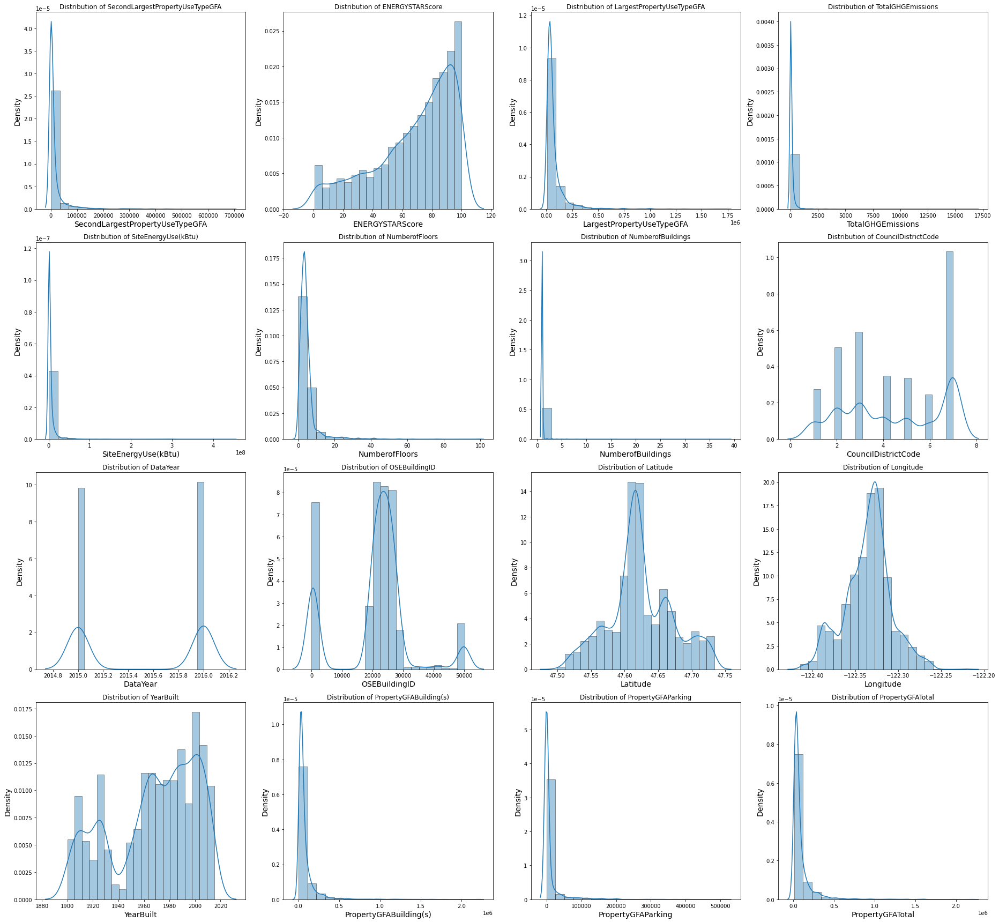

In [ ]:
import seaborn as sns
numerical_col=Seattle_data.select_dtypes(include=np.number).columns
fig=plt.figure(figsize=(26,24))
for i, col in enumerate(numerical_col):
  fig.add_subplot(4,4,i+1)
  sns.distplot(Seattle_data[col],bins=20,hist_kws=dict(edgecolor="black", linewidth=1))
  plt.xlabel(col,fontsize=14)
  plt.ylabel('Density',fontsize=14)
  plt.title(f"Distribution of {col}")
  plt.tight_layout()

As we can see in our distributions, we have many skewed variables

Lets check that with the skewness on each feature

In [ ]:
from scipy import stats
skewness_values=[]
for col in Seattle_data.select_dtypes(include=np.number).columns.tolist():
  skew=stats.skew(Seattle_data[~Seattle_data[col].isnull()][col])
  skewness_values.append(skew)

skewed_dt=pd.DataFrame({"skew":skewness_values},index=Seattle_data.select_dtypes(include=np.number).columns.tolist())
skewed_dt

,skew
SecondLargestPropertyUseTypeGFA,6.391644
ENERGYSTARScore,-0.863995
LargestPropertyUseTypeGFA,6.484967
TotalGHGEmissions,21.000151
SiteEnergyUse(kBtu),14.333558
NumberofFloors,5.992677
NumberofBuildings,38.713376
CouncilDistrictCode,-0.077930
DataYear,-0.033410
OSEBuildingID,-0.107848


We have variable that we don't need to check their distribution, since it makes no sence. Like **OSEBuildingID** ,**DataYear** or **ENERGYSTARScore** or **YearBuilt** and **CouncilDistrictCode**

##Detecting And Treating Outliers

There are different ways to deal with outliers:

- The **z-score** which needs to be applied critically due to its sensitivity to mean and standard deviation and its assumption of a normally distributed variable. 

- The **MAD method** is often used instead and serves as a more robust alternative.

- **Tukey’s box plot** method offers robust results and can be easily extended when the data is highly skewed.

In [ ]:
from scipy import stats
def fix_outliers(df,variables,log=True):


  for col in variables:
    z=np.abs(stats.zscore(df[col]))
    idx_outliers=np.where(z>3,True,False)
    idx=pd.Series(idx_outliers,index=df[col].index)

    df.loc[idx==True,col]=np.nan
    
    if log:
      if df[col].min()>=0:
        df[col]=np.log2(df[col]+1)
      else:
        df[col]=df[col]
    else:
      df[col]=(df[col]-df[col].min())/(df[col].max()-df[col].min())

  return df 

In [ ]:
Seattle_data=fix_outliers(Seattle_data,['SecondLargestPropertyUseTypeGFA','LargestPropertyUseTypeGFA', 'TotalGHGEmissions',
                                        'SiteEnergyUse(kBtu)','NumberofFloors', 'Latitude', 'Longitude',
                                        'PropertyGFABuilding(s)', 'PropertyGFAParking', 'PropertyGFATotal'],log=True)

### Mapping Properties Use Type

We will go through each property use type and categorise them into main **categories**

In [ ]:
Seattle_data[['PrimaryPropertyType','LargestPropertyUseType','SecondLargestPropertyUseType','NumberofBuildings']].sample(20)

,PrimaryPropertyType,LargestPropertyUseType,SecondLargestPropertyUseType,NumberofBuildings
5230,Other,Other,Leisure,1.0
4983,Housing,Housing,Other,1.0
2801,Housing,Housing,No Use,1.0
3808,business storage,business storage,business storage,1.0
6486,Housing,Housing,No Use,1.0
2207,Other,Other,No Use,1.0
1332,Office,Office,Other,1.0
6182,Housing,Housing,No Use,1.0
2302,Housing,Housing,Other,1.0
4102,Housing,Housing,No Use,1.0


In [ ]:
Seattle_data['LargestPropertyUseType'].unique()

array(['Hotel', 'Police Station', 'Other - Entertainment/Public Assembly',
       'Multifamily Housing', nan, 'Library',
       'Fitness Center/Health Club/Gym', 'Social/Meeting Hall',
       'Courthouse', 'Other', 'K-12 School', 'College/University',
       'Automobile Dealership', 'Office', 'Self-Storage Facility',
       'Retail Store', 'Senior Care Community', 'Medical Office',
       'Hospital (General Medical & Surgical)', 'Museum',
       'Repair Services (Vehicle, Shoe, Locksmith, etc)',
       'Other - Lodging/Residential', 'Residence Hall/Dormitory',
       'Other/Specialty Hospital', 'Financial Office',
       'Non-Refrigerated Warehouse', 'Distribution Center', 'Parking',
       'Worship Facility', 'Laboratory', 'Supermarket/Grocery Store',
       'Convention Center', 'Urgent Care/Clinic/Other Outpatient',
       'Other - Services', 'Strip Mall', 'Wholesale Club/Supercenter',
       'Refrigerated Warehouse', 'Other - Recreation', 'Lifestyle Center',
       'Other - Public S

In [ ]:
Seattle_data['SecondLargestPropertyUseType'].unique()

array([nan, 'Parking', 'Office', 'Restaurant', 'K-12 School',
       'Non-Refrigerated Warehouse', 'Other - Education',
       'Vocational School', 'Retail Store',
       'Other - Entertainment/Public Assembly', 'Data Center',
       'Swimming Pool', 'Other', 'Courthouse', 'Residence Hall/Dormitory',
       'Distribution Center', 'Self-Storage Facility', 'Other - Services',
       'Laboratory', 'Movie Theater', 'Supermarket/Grocery Store',
       'Medical Office', 'Other - Recreation',
       'Convenience Store without Gas Station',
       'Fitness Center/Health Club/Gym', 'Performing Arts',
       'College/University', 'Other - Restaurant/Bar', 'Adult Education',
       'Multifamily Housing', 'Bar/Nightclub', 'Financial Office',
       'Repair Services (Vehicle, Shoe, Locksmith, etc)',
       'Other - Lodging/Residential', 'Bank Branch', 'Food Service',
       'Worship Facility', 'Senior Care Community',
       'Refrigerated Warehouse', 'Hotel', 'Food Sales',
       'Other/Specialty H

We will group these data into main categories such as: 

- **Health**: Other/Specialty Hospital, Personal Services (Health/Beauty, Dry Cleaning, etc) ...

- **Office**: Bank Branch, Data Center etc ...

- **business storage**: Retail Store, Enclosed Mall

- **Institution**: Other - Education, K-12 School

- **Housing**: Hotel, Other - Lodging/Residential

- **Leisure**: Museum, Bar/Nightclub

- **Other**: Other, Courthouse





In [ ]:
def Map_UseType(df,features):

  mapping_property_type={'Hotel':'Housing',
                       'Multifamily Housing':'Housing',
                       'Senior Care Community':'Housing',
                       'Other - Lodging/Residential':'Housing',
                       'Residence Hall/Dormitory':'Housing', 
                       'Other - Lodging/Residential':'Housing',
                       'Residence Hall/Dormitory':'Housing',
                       'Residential Care Facility':'Housing',
                       'Mid-Rise Multifamily':'Housing',
                       'Low-Rise Multifamily':'Housing',
                       'High-Rise Multifamily':'Housing',
                       'Residence Hall':'Housing',

                       'Police Station':'Other',
                       'Courthouse':'Other',
                       'Other':'Other',
                       'Parking':'Other',
                       'Worship Facility':'Other',
                       'Other - Utility':'Other',
                       'Fire Station':'Other',
                       'Mixed Use Property':'Other',
                       'Prison/Incarceration':'Other',

                       'Other - Entertainment/Public Assembly':'Leisure',
                       'Library':'Leisure',
                       'Fitness Center/Health Club/Gym':'Leisure',
                       'Social/Meeting Hall':'Leisure',
                       'Museum':'Leisure',
                       'Other - Recreation':'Leisure',
                       'Restaurant':'Leisure',
                       'Performing Arts':'Leisure',
                       'Other - Restaurant/Bar':'Leisure',
                       'Food Service':'Leisure',
                       'Movie Theater':'Leisure',
                       'Swimming Pool':'Leisure',
                       'Restaurant\n':'Leisure',
                       'Bar/Nightclub':'Leisure',
       
        
                       'K-12 School':'Institution',
                       'College/University':'Institution',
                       'Other - Education':'Institution',
                       'Pre-school/Daycare':'Institution',           
                       'Vocational School':'Institution',
                       'Adult Education':'Institution',
                       'SPS-District K-12':'Institution',
                       'University':'Institution',
                       
                       
                       'Automobile Dealership':'business storage',
                       'Self-Storage Facility':'business storage',
                       'Retail Store':'business storage',
                       'Non-Refrigerated Warehouse':'business storage',
                       'Distribution Center':'business storage',
                       'Supermarket/Grocery Store':'business storage',
                       'Strip Mall':'business storage',
                       'Wholesale Club/Supercenter':'business storage',
                       'Refrigerated Warehouse':'business storage',
                       'Lifestyle Center':'business storage',
                       'Other - Mall':'business storage',
                       'Manufacturing/Industrial Plant':'business storage',
                       'Convenience Store without Gas Station':'business storage',
                       'Food Sales':'business storage',
                       'Enclosed Mall':'business storage',
                       'Self-Storage Facility\n':'business storage',
                       'Distribution Center\n':'business storage',
                       'Warehouse':'business storage',
                       'Supermarket / Grocery Store':'business storage',
                       
                       
                       
                       'Medical Office':'Health',
                       'Hospital (General Medical & Surgical)':'Health',
                       'Other/Specialty Hospital':'Health',
                       'Laboratory':'Health',
                       'Urgent Care/Clinic/Other Outpatient':'Health',
                       'Outpatient Rehabilitation/Physical Therapy':'Health',
                       'Personal Services (Health/Beauty, Dry Cleaning, etc)':'Health',
                       'Hospital':'Health',
                       
                       
                       'Financial Office':'Office',
                       'Repair Services (Vehicle, Shoe, Locksmith, etc)':'Office',
                       'Convention Center':'Office',
                       'Office':'Office',
                       'Other - Services':'Office',
                       'Other - Public Services':'Office',
                       'Data Center':'Office',
                       'Bank Branch':'Office',
                       'Small- and Mid-Sized Office':'Office',
                       'Large Office':'Office'
        }
  
  

  for col in features:
    df[col]=df[col].map(mapping_property_type)

  return df  

In [ ]:
Seattle_data=Map_UseType(Seattle_data,['LargestPropertyUseType','SecondLargestPropertyUseType','PrimaryPropertyType'])

In [ ]:
Seattle_data[['LargestPropertyUseType','SecondLargestPropertyUseType','PrimaryPropertyType']].nunique()

LargestPropertyUseType          7
SecondLargestPropertyUseType    7
PrimaryPropertyType             7
dtype: int64

In [ ]:
Seattle_data['SecondLargestPropertyUseType'].value_counts()

No Use              2767
Other               1684
Office               392
business storage     368
Leisure              162
Health                34
Housing               29
Institution           19
Name: SecondLargestPropertyUseType, dtype: int64

In [ ]:
nan_percentage(Seattle_data).head()

,feature,percentage_nan
0,SecondLargestPropertyUseTypeGFA,51.609522
1,SecondLargestPropertyUseType,51.609522
2,ENERGYSTARScore,23.790987
3,LargestPropertyUseType,2.215901
4,LargestPropertyUseTypeGFA,2.215901


we have over 50% of **SecondLargestPropertyUseType** values missing 

to deal with such case, we will impute these nans depending on the number of buildings:

- **No use** if we have missing value and only one building

- **No information** if we have missing value but more than one building

and 156 nans in **LargestPropertyUseType** whcih we will impute like the **PrimaryUseType**

In [ ]:
Seattle_data.describe()

,SecondLargestPropertyUseTypeGFA,ENERGYSTARScore,LargestPropertyUseTypeGFA,GHGEmissionsIntensity,NaturalGas(kBtu),NaturalGas(therms),Electricity(kWh),Electricity(kBtu),TotalGHGEmissions,SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SteamUse(kBtu),SiteEUIWN(kBtu/sf),SiteEnergyUseWN(kBtu),SiteEUI(kBtu/sf),SiteEnergyUse(kBtu),NumberofFloors,NumberofBuildings,CouncilDistrictCode,DataYear,OSEBuildingID,Latitude,Longitude,YearBuilt,PropertyGFABuilding(s),PropertyGFAParking,PropertyGFATotal
count,3232.000000,5090.000000,6.531000e+03,6675.000000,6.675000e+03,6.675000e+03,6.675000e+03,6.675000e+03,6675.000000,6675.000000,6675.000000,6.675000e+03,6678.000000,6.678000e+03,6679.000000,6.679000e+03,6671.000000,6676.000000,6679.000000,6679.000000,6679.000000,6679.000000,6679.000000,6679.000000,6.679000e+03,6679.000000,6.679000e+03
mean,27893.330847,67.908644,7.697662e+04,1.083585,1.313525e+06,1.313526e+04,1.055426e+06,3.601185e+06,115.195317,133.950936,138.814037,2.633728e+05,57.460288,5.255312e+06,54.308579,5.209777e+06,4.705142,1.085530,4.443480,2015.501722,20910.756700,47.623987,-122.334901,1968.125917,8.324883e+04,9567.436892,9.278816e+04
std,52250.561691,27.011211,1.680597e+05,1.736753,5.694235e+06,5.694235e+04,3.665403e+06,1.250651e+07,479.623968,135.682976,135.290297,3.710291e+06,56.362696,1.503054e+07,55.079045,1.816380e+07,5.481070,1.592311,2.124333,0.500034,11860.468499,0.047787,0.027139,33.055253,1.730306e+05,33955.008058,1.873039e+05
min,0.000000,1.000000,5.656000e+03,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.080000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.200000,1.144100e+04,0.000000,1.000000,1.000000,2015.000000,1.000000,47.499170,-122.414250,1900.000000,3.636000e+03,0.000000,1.128500e+04
25%,4968.000000,52.000000,2.500000e+04,0.160000,0.000000e+00,0.000000e+00,1.875121e+05,6.398040e+05,9.470000,74.300003,79.400002,0.000000e+00,29.600000,9.866438e+05,27.700000,9.250385e+05,2.000000,1.000000,3.000000,2015.000000,19969.000000,47.599825,-122.350560,1948.000000,2.727000e+04,0.000000,2.846000e+04
50%,10620.500000,75.000000,3.943200e+04,0.540000,3.090350e+05,3.090355e+03,3.428876e+05,1.169932e+06,33.280000,95.900000,102.200000,0.000000e+00,40.900002,1.936660e+06,38.099998,1.796889e+06,4.000000,1.000000,4.000000,2016.000000,23076.000000,47.618500,-122.332630,1974.000000,4.217200e+04,0.000000,4.399800e+04
75%,26466.000000,90.000000,7.415150e+04,1.280000,1.150974e+06,1.150959e+04,8.213551e+05,2.802522e+06,91.610000,144.050000,150.000000,0.000000e+00,65.000000,4.383999e+06,60.299999,4.160657e+06,5.000000,1.000000,7.000000,2016.000000,25883.000000,47.657082,-122.319764,1997.000000,8.130000e+04,0.000000,8.954950e+04
max,686750.000000,100.000000,9.320156e+06,34.090000,2.979090e+08,2.979090e+06,1.925775e+08,6.570744e+08,16870.980000,2620.000000,2620.000000,1.349435e+08,834.400024,4.716139e+08,834.400024,8.739237e+08,99.000000,111.000000,7.000000,2016.000000,50226.000000,47.733870,-122.220470,2015.000000,9.320156e+06,512608.000000,9.320156e+06


In [ ]:
def fill_nan(df):

  #Replace nan in LargetPropertyUseType with PrimaryPropertyUseType values

  df.loc[df['LargestPropertyUseType'].isna(),'LargestPropertyUseType']=df['PrimaryPropertyType']

  #Impute the largest GFA with all the Buildings GFA in case of a single Building

  index_largest_use=df.loc[(df['LargestPropertyUseTypeGFA'].isna())&(df['NumberofBuildings']==1.0),'LargestPropertyUseTypeGFA'].index.tolist()

  for i in index_largest_use:
    df.loc[i]['LargestPropertyUseTypeGFA']=df.loc[i]['PropertyGFABuilding(s)']

    
  #fill SecondLargestPropertyUseType nans with **No Use** in case of a single building and **No Information** in case of multiple buildings
  
  df.loc[(df['SecondLargestPropertyUseType'].isna())&(df['NumberofBuildings']==1.0),'SecondLargestPropertyUseType']='No Use'

  df.loc[(df['SecondLargestPropertyUseType'].isna())&(df['NumberofBuildings']>1.0),'SecondLargestPropertyUseType']='No Information'

 
  # In case of **No Use** SecondLargestGFA will be assigned to 0
  
  df.loc[(df['SecondLargestPropertyUseType']=='No Use'),'SecondLargestPropertyUseTypeGFA']=0
  
  # Impute **SecondLargestGFA** in case of multiple buildings with the difference between the **propertyGFA** and the **LargestGFA** '''
  
  index_second_use=df.loc[(df['SecondLargestPropertyUseTypeGFA'].isna())&(df['NumberofBuildings']==2.0),'SecondLargestPropertyUseTypeGFA'].index.tolist()

  for x in index_second_use:
    if df.loc[x]['PropertyGFABuilding(s)']> df.loc[x]['LargestPropertyUseTypeGFA']:
      df.loc[x]['SecondLargestPropertyUseTypeGFA']=df.loc[x]['PropertyGFABuilding(s)']- df.loc[x]['LargestPropertyUseTypeGFA']

    else:
      df.loc[x]['SecondLargestPropertyUseTypeGFA']=np.nan


  #We are keeping inputs where ENERGYSTARScore are missing, since we are trying to see the influence of this variable on our targets 
  #for the other rows presenting missing values, we are going to drop them
  
  no_score_df=df.drop('ENERGYSTARScore',axis=1)
  index_to_delete=no_score_df[no_score_df.isna().any(axis='columns')].index.tolist()
  df.drop(index_to_delete,axis=0,inplace=True)
  
  return df

In [ ]:
Seattle_data=fill_nan(Seattle_data)

In [ ]:
nan_percentage(Seattle_data).head()

,feature,percentage_nan
0,ENERGYSTARScore,23.56331
1,BuildingType,0.00000
2,Electricity(kWh),0.00000
3,SiteEnergyUseWN(kBtu),0.00000
4,SiteEUIWN(kBtu/sf),0.00000


In [ ]:
Seattle_data.describe()

,SecondLargestPropertyUseTypeGFA,ENERGYSTARScore,LargestPropertyUseTypeGFA,GHGEmissionsIntensity,NaturalGas(kBtu),NaturalGas(therms),Electricity(kWh),Electricity(kBtu),TotalGHGEmissions,SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SteamUse(kBtu),SiteEUIWN(kBtu/sf),SiteEnergyUseWN(kBtu),SiteEUI(kBtu/sf),SiteEnergyUse(kBtu),NumberofFloors,NumberofBuildings,CouncilDistrictCode,DataYear,OSEBuildingID,Latitude,Longitude,YearBuilt,PropertyGFABuilding(s),PropertyGFAParking,PropertyGFATotal
count,6247.000000,4775.000000,6247.000000,6247.000000,6.247000e+03,6247.000000,6.247000e+03,6.247000e+03,6247.000000,6247.000000,6247.000000,6.247000e+03,6247.000000,6.247000e+03,6247.000000,6247.000000,6247.000000,6247.000000,6247.000000,6247.000000,6247.000000,6247.000000,6247.000000,6247.000000,6247.000000,6247.000000,6247.000000
mean,6.067821,67.780733,15.410654,1.062950,9.802191e+05,9802.192932,7.083584e+05,2.416968e+06,4.989401,129.155627,134.341284,1.314446e+05,55.908644,3.709802e+06,52.659869,20.873466,2.174891,1.026093,4.411718,2015.508564,21263.601089,5.603607,-122.335044,1967.243637,15.557429,2.712742,15.642901
std,6.797639,26.978453,1.068636,1.658353,2.043371e+06,20433.706973,1.141866e+06,3.896124e+06,1.938070,121.767786,121.677656,1.202785e+06,52.955124,5.629474e+06,51.496721,1.506454,0.759810,0.410545,2.119813,0.499967,11436.438071,0.001429,0.027347,33.166111,1.043485,5.576111,1.074198
min,0.000000,1.000000,12.465821,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.111031,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.200000,13.482052,0.000000,1.000000,1.000000,2015.000000,1.000000,5.599888,-122.414250,1900.000000,11.828533,0.000000,13.462247
25%,0.000000,52.000000,14.593099,0.160000,0.000000e+00,0.000000,1.838210e+05,6.272105e+05,3.317594,73.699997,79.000000,0.000000e+00,29.450000,9.640101e+05,27.400000,19.781632,1.584963,1.000000,3.000000,2015.000000,20163.500000,5.602874,-122.351768,1946.000000,14.706982,0.000000,14.774864
50%,0.000000,75.000000,15.204877,0.540000,2.912030e+05,2912.000000,3.254486e+05,1.110431e+06,4.982309,94.200000,100.900000,0.000000e+00,40.200000,1.839508e+06,37.400000,20.708031,2.321928,1.000000,4.000000,2016.000000,23175.000000,5.603456,-122.332443,1972.000000,15.314831,0.000000,15.376363
75%,13.224303,90.000000,16.028640,1.290000,1.084260e+06,10842.854980,7.264505e+05,2.478649e+06,6.350849,139.699997,145.500000,0.000000e+00,64.000000,3.901265e+06,59.049999,21.804187,2.584963,1.000000,7.000000,2016.000000,25931.000000,5.604606,-122.319183,1995.000000,16.160502,0.000000,16.295813
max,18.376181,100.000000,19.191720,31.380000,3.341410e+07,334141.000000,1.433564e+07,4.891523e+07,11.330217,2620.000000,2620.000000,3.103019e+07,834.400024,6.020290e+07,834.400024,25.816841,6.643856,16.000000,7.000000,2016.000000,50226.000000,5.606853,-122.258640,2015.000000,19.172481,16.745911,19.172481


In [ ]:
nan_percentage(Seattle_data).head()

,feature,percentage_nan
0,ENERGYSTARScore,23.56944
1,BuildingType,0.00000
2,Electricity(kWh),0.00000
3,SiteEnergyUseWN(kBtu),0.00000
4,SiteEUIWN(kBtu/sf),0.00000


### Rename columns

In [ ]:
Seattle_data.columns

Index(['SecondLargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'ENERGYSTARScore', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'ListOfAllPropertyUseTypes',
       'GHGEmissionsIntensity', 'NaturalGas(kBtu)', 'NaturalGas(therms)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'TotalGHGEmissions',
       'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)', 'SteamUse(kBtu)',
       'SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)', 'SiteEnergyUseWN(kBtu)',
       'SiteEnergyUse(kBtu)', 'NumberofFloors', 'NumberofBuildings',
       'TaxParcelIdentificationNumber', 'CouncilDistrictCode', 'DataYear',
       'DefaultData', 'ComplianceStatus', 'OSEBuildingID', 'Latitude',
       'Longitude', 'Neighborhood', 'YearBuilt', 'Outlier',
       'PrimaryPropertyType', 'PropertyGFABuilding(s)', 'PropertyGFAParking',
       'PropertyGFATotal', 'PropertyName', 'BuildingType'],
      dtype='object')

## Which features to keep as our target

We want to predict CO2 emissions and total energy consumption 

We can find these two targets in the  **SiteEnergyUse** for energy consumption and **TotalGHGEmissions** for the CO2 emissions.

In [ ]:
Seattle_data[['NaturalGas(kBtu)','Electricity(kBtu)','SteamUse(kBtu)','SiteEnergyUse(kBtu)']]

,NaturalGas(kBtu),Electricity(kBtu),SteamUse(kBtu),SiteEnergyUse(kBtu)
0,1.272388e+06,3.686160e+06,2023032.0,6.981428e+06
1,4.448985e+06,3.905411e+06,0.0,8.354235e+06
2,3.709900e+06,4.976244e+07,19660404.0,7.313066e+07
3,2.001894e+06,2.769023e+06,23458518.0,2.822932e+07
4,8.763105e+06,6.066245e+06,0.0,1.482910e+07
...,...,...,...,...
6711,3.254750e+05,5.242709e+05,0.0,8.497457e+05
6712,5.537300e+05,3.965461e+05,0.0,9.502762e+05
6713,3.973739e+06,1.792159e+06,0.0,5.765898e+06
6714,3.706010e+05,3.488702e+05,0.0,7.194712e+05


Site Energy use is nothing but the building’s total annual energy use
(electricity, natural gas & steam). It is measured in kBtu(one thousand British thermal units)

Surface based measure like (**SiteEUI(kBtu/sf)**, **SiteEUIWN(kBtu/sf)**  etc ) can be obtained by dividing main measures according to square foot surfaces

Electricity is given with different units 

All these features are to drop

In [ ]:
columns= ['SiteEUI(kBtu/sf)','SiteEUIWN(kBtu/sf)','SourceEUI(kBtu/sf)','SourceEUIWN(kBtu/sf)','SiteEnergyUseWN(kBtu)','SteamUse(kBtu)',
                        'Electricity(kWh)','Electricity(kBtu)','NaturalGas(therms)','NaturalGas(kBtu)','GHGEmissionsIntensity']

In [ ]:
Seattle_data.drop(columns,axis=1,inplace=True)

In [ ]:
Seattle_data.columns

Index(['SecondLargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'ENERGYSTARScore', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'ListOfAllPropertyUseTypes',
       'TotalGHGEmissions', 'SiteEnergyUse(kBtu)', 'NumberofFloors',
       'NumberofBuildings', 'TaxParcelIdentificationNumber',
       'CouncilDistrictCode', 'DataYear', 'DefaultData', 'ComplianceStatus',
       'OSEBuildingID', 'Latitude', 'Longitude', 'Neighborhood', 'YearBuilt',
       'Outlier', 'PrimaryPropertyType', 'PropertyGFABuilding(s)',
       'PropertyGFAParking', 'PropertyGFATotal', 'PropertyName',
       'BuildingType'],
      dtype='object')

In [ ]:
Seattle_data.shape

(6486, 27)

###Reducing Numerical Features

In [ ]:
Seattle_data.select_dtypes(include=np.number).columns

Index(['SecondLargestPropertyUseTypeGFA', 'ENERGYSTARScore',
       'LargestPropertyUseTypeGFA', 'TotalGHGEmissions', 'SiteEnergyUse(kBtu)',
       'NumberofFloors', 'NumberofBuildings', 'CouncilDistrictCode',
       'DataYear', 'OSEBuildingID', 'Latitude', 'Longitude', 'YearBuilt',
       'PropertyGFABuilding(s)', 'PropertyGFAParking', 'PropertyGFATotal'],
      dtype='object')

In [ ]:
Seattle_data.describe()

,SecondLargestPropertyUseTypeGFA,ENERGYSTARScore,LargestPropertyUseTypeGFA,TotalGHGEmissions,SiteEnergyUse(kBtu),NumberofFloors,NumberofBuildings,CouncilDistrictCode,DataYear,OSEBuildingID,Latitude,Longitude,YearBuilt,PropertyGFABuilding(s),PropertyGFAParking,PropertyGFATotal
count,2839.000000,1872.000000,2839.000000,2839.000000,2839.000000,2839.000000,2839.000000,2839.000000,2839.000000,2839.000000,2839.000000,2839.000000,2839.000000,2839.000000,2839.000000,2839.000000
mean,12.231761,69.648504,15.297928,5.060704,20.987710,2.233734,1.043325,4.554068,2015.516379,21358.423389,5.603612,-122.335549,1969.829517,15.585190,4.177546,15.722093
std,3.897957,27.215775,1.041572,1.809067,1.366465,0.744031,0.473271,2.113870,0.499820,11815.653741,0.001343,0.024698,34.844978,0.956048,6.435688,0.986366
min,0.000000,1.000000,12.465821,0.124328,13.711022,0.000000,1.000000,1.000000,2015.000000,2.000000,5.599979,-122.407775,1900.000000,11.828533,0.000000,13.640471
25%,12.116669,55.000000,14.526560,3.539158,19.970228,1.584963,1.000000,3.000000,2015.000000,20090.500000,5.602916,-122.349129,1948.000000,14.788259,0.000000,14.891689
50%,13.182860,78.000000,15.158215,5.103078,20.917882,2.321928,1.000000,4.000000,2016.000000,23220.000000,5.603416,-122.333350,1979.000000,15.418281,0.000000,15.531656
75%,14.181152,92.000000,16.024631,6.403694,21.969170,2.807355,1.000000,7.000000,2016.000000,26015.000000,5.604536,-122.321311,2000.000000,16.307788,12.598052,16.469320
max,17.151601,100.000000,18.219301,9.632268,24.452943,5.087463,16.000000,7.000000,2016.000000,50226.000000,5.606853,-122.262990,2015.000000,18.000952,16.621150,18.020264


### Consumption outliers between 2015/2016

In [ ]:
data_test2=Seattle_data.groupby('OSEBuildingID').filter(lambda x: len(x)>1).sort_values("OSEBuildingID").groupby('OSEBuildingID')['TotalGHGEmissions'].agg(['max','min'])
data_test2['marge']=round((1-(data_test2['min']/data_test2['max'])),2)*100
data_test2.sort_values('marge',ascending=False)

,max,min,marge
OSEBuildingID,,,
23730,2.839960,0.111031,96.0
24205,5.450551,1.604071,71.0
27361,6.701410,1.989139,70.0
49784,2.298658,0.847997,63.0
24547,1.084064,0.432959,60.0
...,...,...,...
23867,5.674404,5.661351,0.0
23909,3.821710,3.812498,0.0
23928,4.574102,4.553361,0.0


In [ ]:
data_test2.describe()

,max,min,marge
count,2968.000000,2968.000000,2968.000000
mean,5.044049,4.887490,3.236523
std,1.939286,1.916791,5.987121
min,0.163499,0.111031,0.000000
25%,3.357552,3.228049,1.000000
50%,5.077457,4.883865,2.000000
75%,6.407650,6.221490,3.000000
max,11.316547,11.260837,96.000000


In [ ]:
Seattle_data.shape

(5556, 27)

In [ ]:
def clean_consumption_diff(df):

  targets=['SiteEnergyUse(kBtu)','TotalGHGEmissions']
  for col in targets:
    data=df.groupby(by='OSEBuildingID').filter(lambda x: len(x)>1).sort_values('OSEBuildingID')
    data_consumption=data.groupby(by='OSEBuildingID')[col].agg(['max','min'])
    data_consumption['marge']=round((1-(data_consumption['min']/data_consumption['max'])),2)*100

    #Tukeys method
    q1=data_consumption['marge'].quantile(0.25)
    q3=data_consumption['marge'].quantile(0.75)
    iqr=q3-q1 #inetrquartile
    low=q1-1.5*iqr
    high=q3+1.5*iqr
    OSE_list=data_consumption[(data_consumption['marge']>=high)|(data_consumption['marge']<=low)].reset_index()['OSEBuildingID'].values
    df=df[~df['OSEBuildingID'].isin(OSE_list)]

  return df


In [ ]:
Seattle_data=clean_consumption_diff(Seattle_data)

In [ ]:
Seattle_data.shape

(5455, 38)

In [ ]:
Seattle_data.describe()

,SecondLargestPropertyUseTypeGFA,ENERGYSTARScore,LargestPropertyUseTypeGFA,GHGEmissionsIntensity,NaturalGas(kBtu),NaturalGas(therms),Electricity(kWh),Electricity(kBtu),TotalGHGEmissions,SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SteamUse(kBtu),SiteEUIWN(kBtu/sf),SiteEnergyUseWN(kBtu),SiteEUI(kBtu/sf),SiteEnergyUse(kBtu),NumberofFloors,NumberofBuildings,CouncilDistrictCode,DataYear,OSEBuildingID,Latitude,Longitude,YearBuilt,PropertyGFABuilding(s),PropertyGFAParking,PropertyGFATotal
count,5455.000000,4223.000000,5455.000000,5455.000000,5.455000e+03,5455.000000,5.455000e+03,5.455000e+03,5455.000000,5455.000000,5455.000000,5.455000e+03,5455.000000,5.455000e+03,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000
mean,6.147289,67.418423,15.444530,1.095336,1.025568e+06,10255.685549,7.408755e+05,2.527918e+06,5.060274,132.695600,138.091219,1.427729e+05,57.421210,3.879655e+06,54.073547,20.955837,2.222518,1.027681,4.463428,2015.509808,21353.973236,5.603659,-122.335257,1968.270761,15.584962,2.809399,15.673301
std,6.815614,26.754652,1.077388,1.678677,2.116864e+06,21168.643699,1.171908e+06,3.998630e+06,1.941177,125.342022,125.056355,1.244572e+06,54.322730,5.779198e+06,52.864424,1.478181,0.752934,0.434744,2.099752,0.499950,11576.533333,0.001415,0.027695,33.090555,1.055609,5.655702,1.086412
min,0.000000,1.000000,12.465821,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.124328,1.100000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.400000,13.711022,0.000000,1.000000,1.000000,2015.000000,1.000000,5.599888,-122.414250,1900.000000,11.828533,0.000000,13.462247
25%,0.000000,52.000000,14.614077,0.160000,0.000000e+00,0.000000,1.915355e+05,6.535460e+05,3.344828,75.500000,81.049999,0.000000e+00,30.100000,1.002991e+06,28.000000,19.845714,2.000000,1.000000,3.000000,2015.000000,20165.000000,5.602929,-122.352948,1948.000000,14.736032,0.000000,14.797130
50%,0.000000,75.000000,15.246778,0.550000,3.019040e+05,3019.000000,3.393900e+05,1.158048e+06,5.082788,95.599998,102.400000,0.000000e+00,40.900002,1.929416e+06,38.000000,20.762175,2.321928,1.000000,4.000000,2016.000000,23213.000000,5.603477,-122.332270,1974.000000,15.339502,0.000000,15.406172
75%,13.275106,89.000000,16.068924,1.330000,1.142242e+06,11422.419925,7.726213e+05,2.636238e+06,6.457791,141.500000,147.500000,0.000000e+00,65.000000,4.124203e+06,60.099998,21.891206,2.584963,1.000000,7.000000,2016.000000,26023.500000,5.604640,-122.318641,1997.000000,16.195343,0.000000,16.345977
max,18.245163,100.000000,19.191720,25.710000,3.341410e+07,334141.000000,1.433564e+07,4.891523e+07,11.330217,2620.000000,2620.000000,3.103019e+07,834.400024,6.020290e+07,834.400024,25.816841,6.643856,16.000000,7.000000,2016.000000,50226.000000,5.606853,-122.258640,2015.000000,19.172481,16.745911,19.172481


# **EDA**

In [ ]:
Seattle_data.columns

Index(['SecondLargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'ENERGYSTARScore', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'ListOfAllPropertyUseTypes',
       'TotalGHGEmissions', 'SiteEnergyUse(kBtu)', 'NumberofFloors',
       'NumberofBuildings', 'TaxParcelIdentificationNumber',
       'CouncilDistrictCode', 'DataYear', 'DefaultData', 'ComplianceStatus',
       'OSEBuildingID', 'Latitude', 'Longitude', 'Neighborhood', 'YearBuilt',
       'Outlier', 'PrimaryPropertyType', 'PropertyGFABuilding(s)',
       'PropertyGFAParking', 'PropertyGFATotal', 'PropertyName',
       'BuildingType'],
      dtype='object')

#### Before jumping to the exploratory data analysis. We need to get rid of some unuseful features that plays no part in the model

In [ ]:
No_use_features = ['OSEBuildingID', #no more useful
                   'PropertyName', #identification variable to remove
                   'TaxParcelIdentificationNumber',  #identification variable to remove
                   'ListOfAllPropertyUseTypes', #informations given in other variables
                   'DataYear' #non chronoligial purpose
                  ] 

In [ ]:
Seattle_data.drop(No_use_features,axis=1,inplace=True)

In [ ]:
Seattle_data.rename({'SiteEnergyUse(kBtu)':'SiteEnergyUse'},axis=1,inplace=True)

## **Univariate Analysis**

### Numerical Features

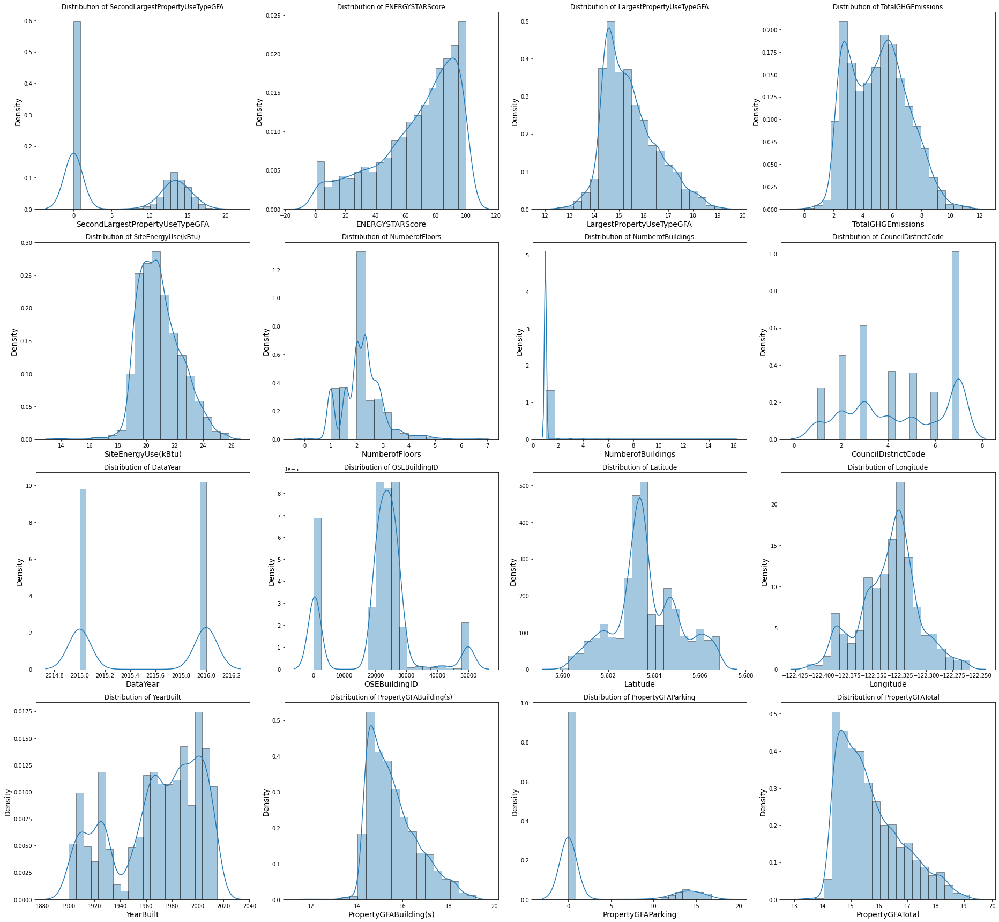

In [ ]:
import seaborn as sns
numerical_col=Seattle_data.select_dtypes(include=np.number).columns
fig=plt.figure(figsize=(26,24))
for i, col in enumerate(numerical_col):
  fig.add_subplot(4,4,i+1)
  sns.distplot(Seattle_data[col],bins=20,hist_kws=dict(edgecolor="black", linewidth=1))
  plt.xlabel(col,fontsize=14)
  plt.ylabel('Density',fontsize=14)
  plt.title(f"Distribution of {col}")
  plt.tight_layout()

### Categorical Features

In [ ]:
categorical_columns=Seattle_data.select_dtypes(exclude=np.number).columns.values
categorical_columns 

array(['SecondLargestPropertyUseType', 'LargestPropertyUseType',
       'ListOfAllPropertyUseTypes', 'TaxParcelIdentificationNumber',
       'DefaultData', 'ComplianceStatus', 'Neighborhood', 'Outlier',
       'PrimaryPropertyType', 'PropertyName', 'BuildingType'],
      dtype=object)

In [ ]:
Seattle_data.select_dtypes(exclude=np.number).nunique()

SecondLargestPropertyUseType        8
LargestPropertyUseType              7
ListOfAllPropertyUseTypes         337
TaxParcelIdentificationNumber    2718
DefaultData                         2
ComplianceStatus                    2
Neighborhood                       13
Outlier                             3
PrimaryPropertyType                 7
PropertyName                     4686
BuildingType                        8
dtype: int64

#### *values distribution*

In [ ]:
def get_percentile(plot, feature):
    total = len(feature)
    for p in plot.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        plot.annotate(percentage, (x, y), size = 12)
    plt.show()

In [ ]:
def categorical_plot1(df,feature):
  feature_dt=df[feature].value_counts(ascending=False).head(20)
  plt.figure(figsize=(8,6))
  g=sns.countplot(feature,data=df,order=feature_dt.index.values)
  plt.xticks(rotation=70)
  get_percentile(g,df[feature])
  plt.show()



In [ ]:
def categorical_plot2(df):

  cat_nunique=df.select_dtypes(exclude=np.number).nunique()
  cols=cat_nunique[cat_nunique<11].index.values
  fig=plt.figure(figsize=(22,18))

  for i,col in enumerate(cols):
    feature_dt=df[col].value_counts(ascending=False)
    fig.add_subplot(3,3,i+1)
    g=sns.countplot(col,data=df,order=feature_dt.index.values)
    plt.xticks(rotation=70)
    get_percentile(g,df[col])
  plt.show()



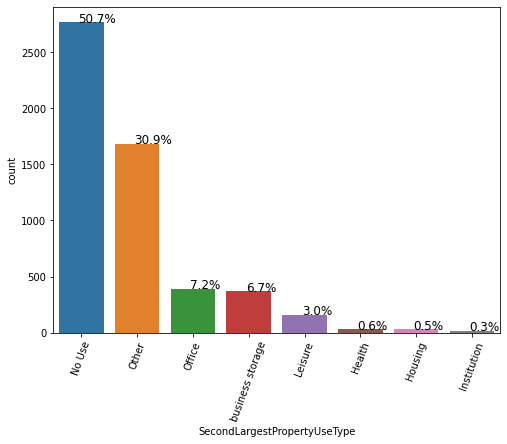

In [ ]:
categorical_plot1(Seattle_data,'SecondLargestPropertyUseType')


#### *Pie-chart distribution*

In [ ]:
def categorical_plot3(df,feature):

  fig=plt.figure(figsize=(10,8))

  pie_data=df[feature].value_counts(normalize=True)
    
  explode=pie_data.apply(lambda x:(x>=0.5) | (x<=0.1))
  explode=explode.apply(lambda x:0.05 if x==True else 0)
  legend=pie_data.index.values
  plt.pie(pie_data.mul(100),labels=pie_data.index.values,shadow=False,explode=explode,startangle=90,rotatelabels=True, autopct='%1.1f%%')
  plt.legend(legend,loc='upper left')


  plt.show()

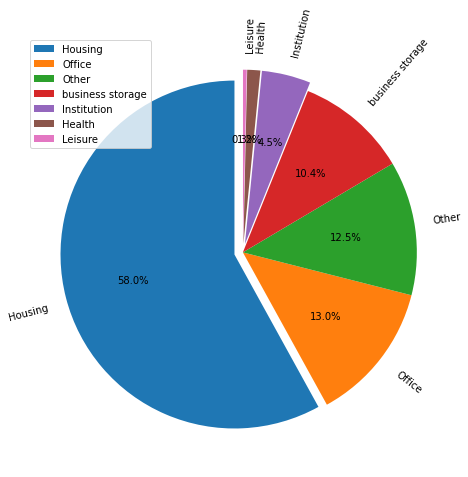

In [ ]:
categorical_plot3(Seattle_data,'PrimaryPropertyType')

## **Bi-variate Analysis**

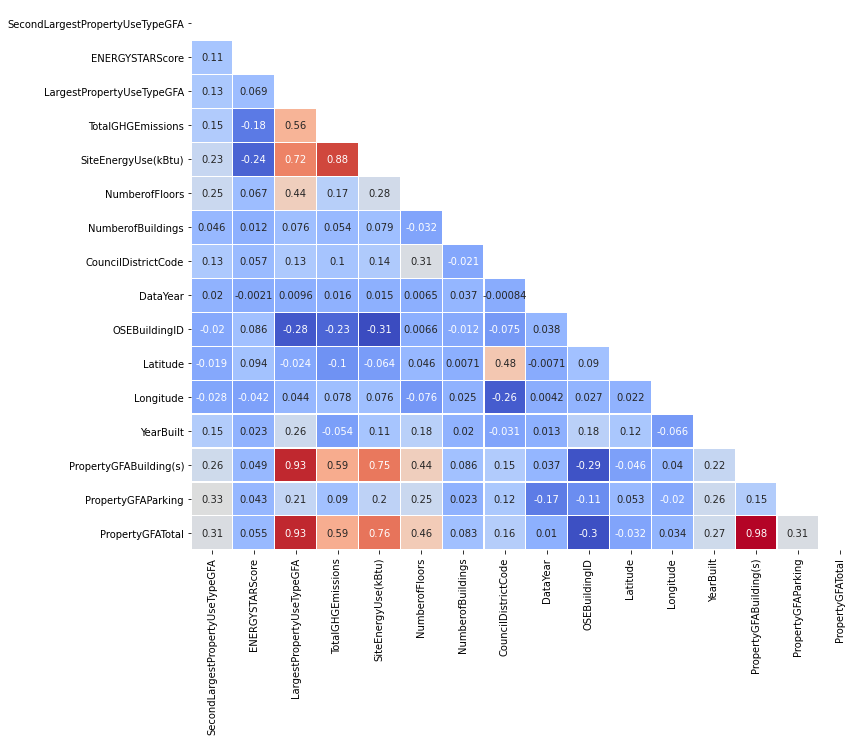

In [ ]:
plt.figure(figsize=(12,10))
Mask=np.triu(np.ones_like(Seattle_data.corr()))
sns.heatmap(Seattle_data.corr(),cmap="coolwarm",annot=True,linewidths=0.1,cbar=False,mask=Mask)
plt.show()

## The influence of the ENERGYStar-Score variable on the Target variables

In [ ]:
def Label_Energyscore(col):
  result=''
  if col<51.0:
    result='Poor'
  elif (col>=51.0)&(col<=74.0):
    result='Fair'
  elif (col>=75.0)&(col<=90.0):
    result='Good'
  elif col>=91.0:
    result='Excellent'
  else:
    result=np.nan

  return result

In [ ]:
Seattle_data['Label_EnergyScore']=Seattle_data['ENERGYSTARScore'].apply(Label_Energyscore)

#### The purpose of this transformation is to check the dependecies between the **ENERGYSTARScore** and the targets via the ANOVA test

### Anova test on both targets

In [ ]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
mod=ols('SiteEnergyUse ~ Label_EnergyScore',data=Seattle_data.dropna()).fit()

In [ ]:
anv=sm.stats.anova_lm(mod,type=2)
anv

,df,sum_sq,mean_sq,F,PR(>F)
Label_EnergyScore,3.0,432.498869,144.166290,76.020974,6.925091e-48
Residual,4219.0,8000.917993,1.896402,NaN,NaN


In [ ]:
mod2=ols('TotalGHGEmissions ~ Label_EnergyScore',data=Seattle_data).fit()
anv2=sm.stats.anova_lm(mod2,type=2)
anv2

,df,sum_sq,mean_sq,F,PR(>F)
Label_EnergyScore,3.0,502.918472,167.639491,48.160207,1.346654e-30
Residual,4219.0,14685.796781,3.480871,NaN,NaN


We can see that the variable ENERGYSTAScore has influence on both targets variance

the p-value we found on each anova test is less than 5%

In [ ]:
Seattle_data.select_dtypes(exclude=np.number).nunique()

SecondLargestPropertyUseType       50
LargestPropertyUseType             57
ListOfAllPropertyUseTypes         488
TaxParcelIdentificationNumber    3729
ComplianceStatus                    2
Neighborhood                       13
PrimaryPropertyType                32
PropertyName                     6527
BuildingType                        8
dtype: int64

We can drop the new feature we created since we are using the numerical version in our model

In [ ]:
Seattle_data.drop('Label_EnergyScore',axis=1,inplace=True)

###Reducing Categorical Features

Lets see some dependencies between our targets and some Variables

In [ ]:
Seattle_data.columns

Index(['SecondLargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'ENERGYSTARScore', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'TotalGHGEmissions', 'SiteEnergyUse(kBtu)',
       'NumberofFloors', 'NumberofBuildings', 'CouncilDistrictCode',
       'DefaultData', 'ComplianceStatus', 'Latitude', 'Longitude',
       'Neighborhood', 'YearBuilt', 'Outlier', 'PrimaryPropertyType',
       'PropertyGFABuilding(s)', 'PropertyGFAParking', 'PropertyGFATotal',
       'BuildingType'],
      dtype='object')

In [ ]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

def anova_test(df,target_list):
  for target in target_list:
    for col in df.select_dtypes(exclude=np.number).columns.tolist():
      mod=ols(f'{target}~{col}',data=df).fit()
      anv=sm.stats.anova_lm(mod,type=2)

      if anv.iloc[0,-1]<0.05:
        print("{} and {} are dependant ".format(col,target))
      else:
        print("{} and {} are independant ".format(col,target))

In [ ]:
anova_test(Seattle_data,['SiteEnergyUse','TotalGHGEmissions'])

SecondLargestPropertyUseType and SiteEnergyUse are dependant 
LargestPropertyUseType and SiteEnergyUse are dependant 
DefaultData and SiteEnergyUse are dependant 
ComplianceStatus and SiteEnergyUse are independant 
Neighborhood and SiteEnergyUse are dependant 
Outlier and SiteEnergyUse are dependant 
PrimaryPropertyType and SiteEnergyUse are dependant 
BuildingType and SiteEnergyUse are dependant 
SecondLargestPropertyUseType and TotalGHGEmissions are dependant 
LargestPropertyUseType and TotalGHGEmissions are dependant 
DefaultData and TotalGHGEmissions are dependant 
ComplianceStatus and TotalGHGEmissions are independant 
Neighborhood and TotalGHGEmissions are dependant 
Outlier and TotalGHGEmissions are dependant 
PrimaryPropertyType and TotalGHGEmissions are dependant 
BuildingType and TotalGHGEmissions are dependant 


As we can see, only the feature **ComplianceStatus** is not correlated with both targets

we will not use this variable in our prediction model

**PropertyName** and **TaxParcelIdentificationNumber** has basically no influence on the prediction of gas emissions or energy consumption

**ListOfAllPropertyUseTypes** informations are already mentioned in other features
 


In [ ]:
Seattle_data.drop('ComplianceStatus',axis=1,inplace=True)

In [ ]:
Seattle_data.select_dtypes(exclude=np.number).columns

Index(['SecondLargestPropertyUseType', 'LargestPropertyUseType', 'DefaultData',
       'Neighborhood', 'Outlier', 'PrimaryPropertyType', 'BuildingType'],
      dtype='object')

In [ ]:
import folium
m = folium.Map()
m = folium.Map(location=[Seattle_data['Latitude'].mean(), Seattle_data['Longitude'].mean()],zoom_start=11)
for i in range(0,len(Seattle_data)):
  folium.Circle([Seattle_data.iloc[i]['Latitude'],Seattle_data.iloc[i]['Longitude']]\
                ,radius =10).add_to(m)

In [ ]:
m

In [ ]:
from google.colab import files
Seattle_data.to_csv('cleaned_Seattle_data.csv') 
files.download('cleaned_Seattle_data.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>